In [9]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Remove distortion with img1

In [10]:
img = cv2.imread('img1.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

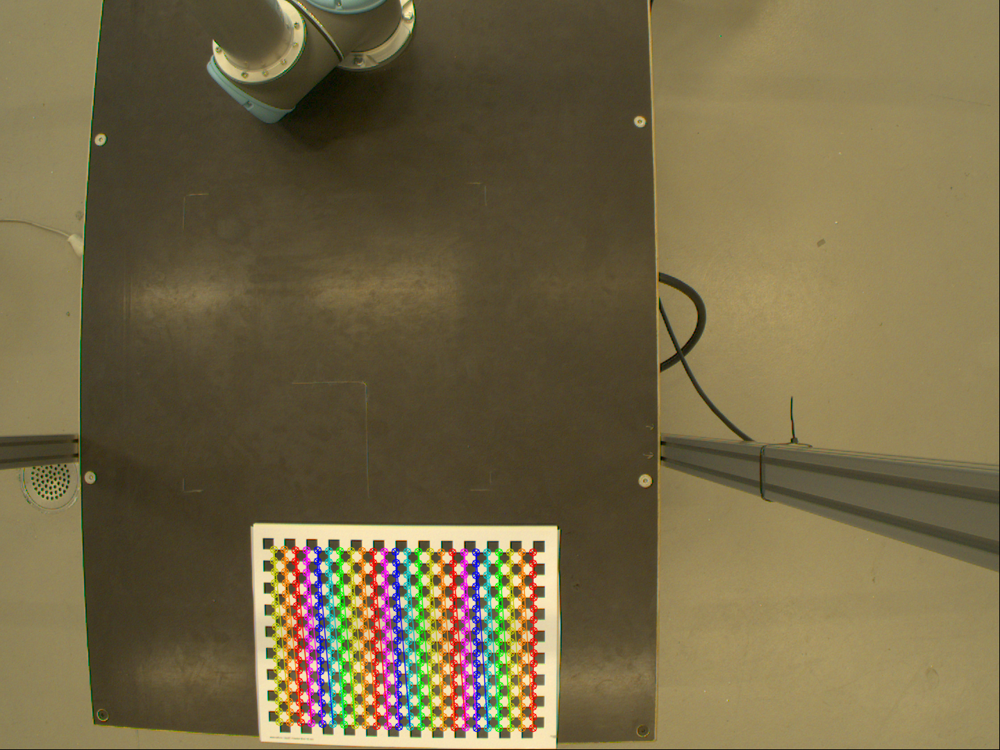

In [11]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((24*17,3), np.float32)
objp[:,:2] = np.mgrid[0:24,0:17].T.reshape(-1,2)
objpoints = []
imgpoints = []

ret, corners = cv2.findChessboardCorners(gray, (17, 24), None)
if ret == True:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (17,24), corners2, ret)
        cv2_imshow(img)


In [12]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [13]:
dist

array([[ 0.06112999, -0.0110414 ,  0.05918889,  0.00035687, -0.11279651]])

In [14]:
img = cv2.imread('img5.png')
h,  w = img.shape[:2]
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

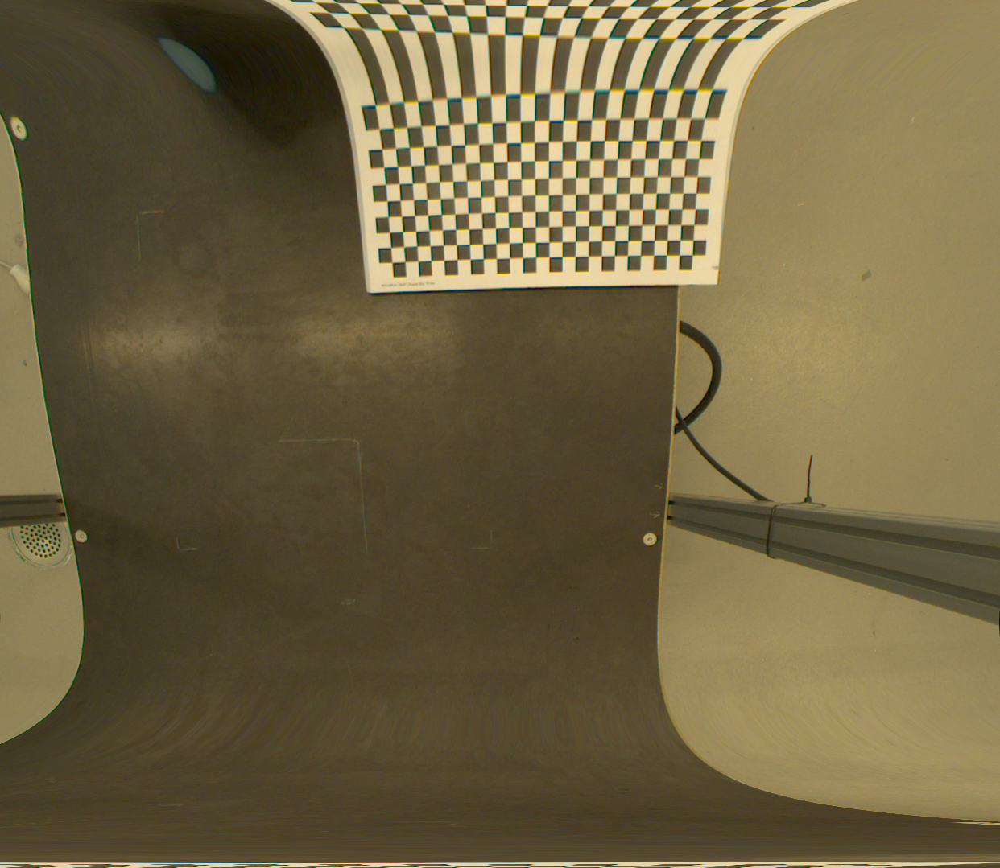

In [15]:
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)
x, y, w, h = roi
dst = dst[y:y+h, x:x+w]
cv2_imshow(dst)

# Remove distortion with img[1-4]

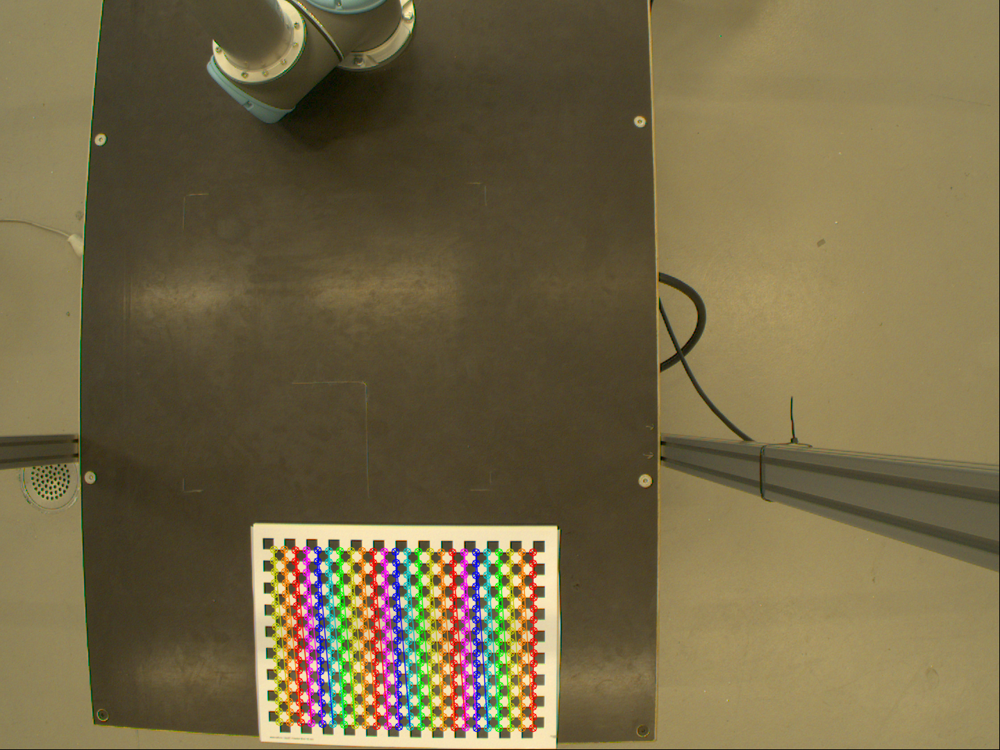

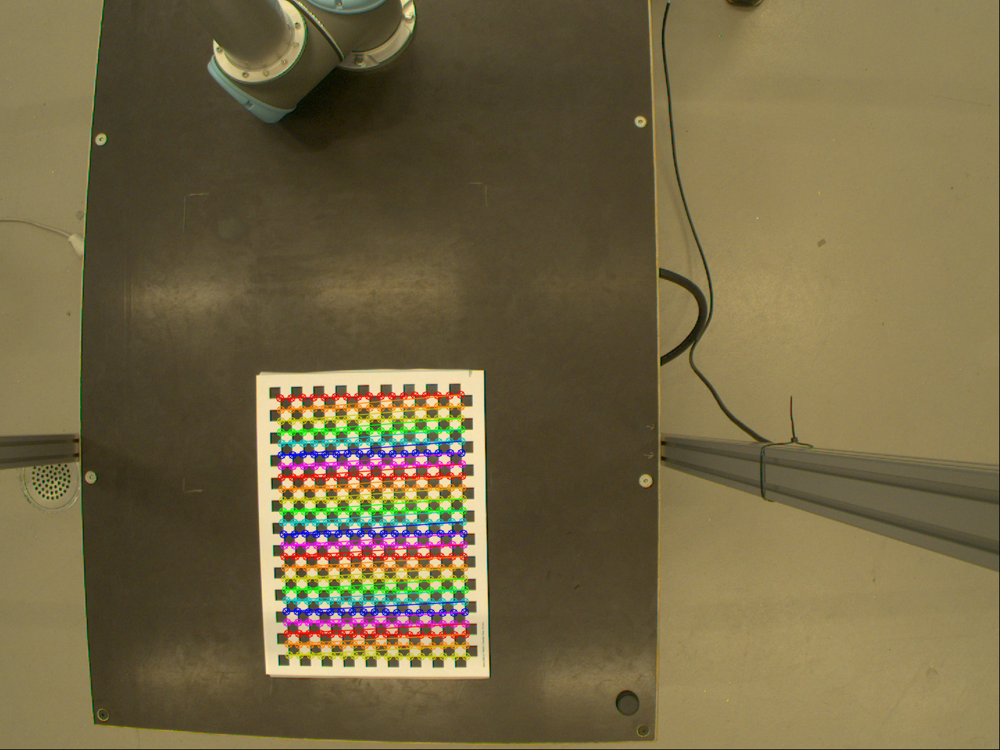

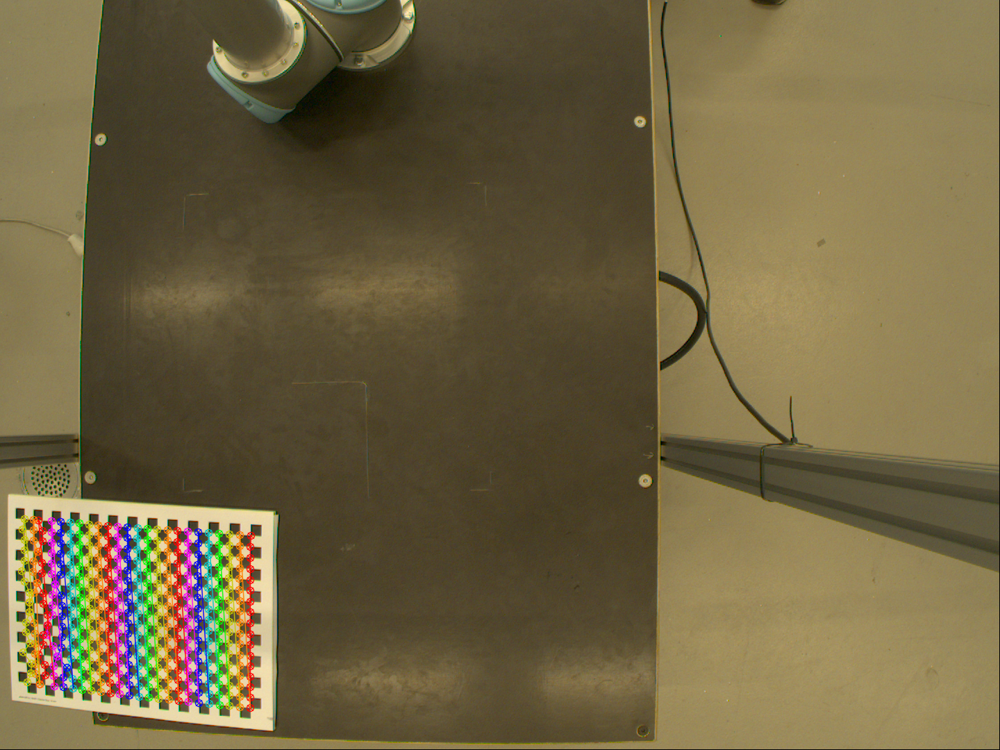

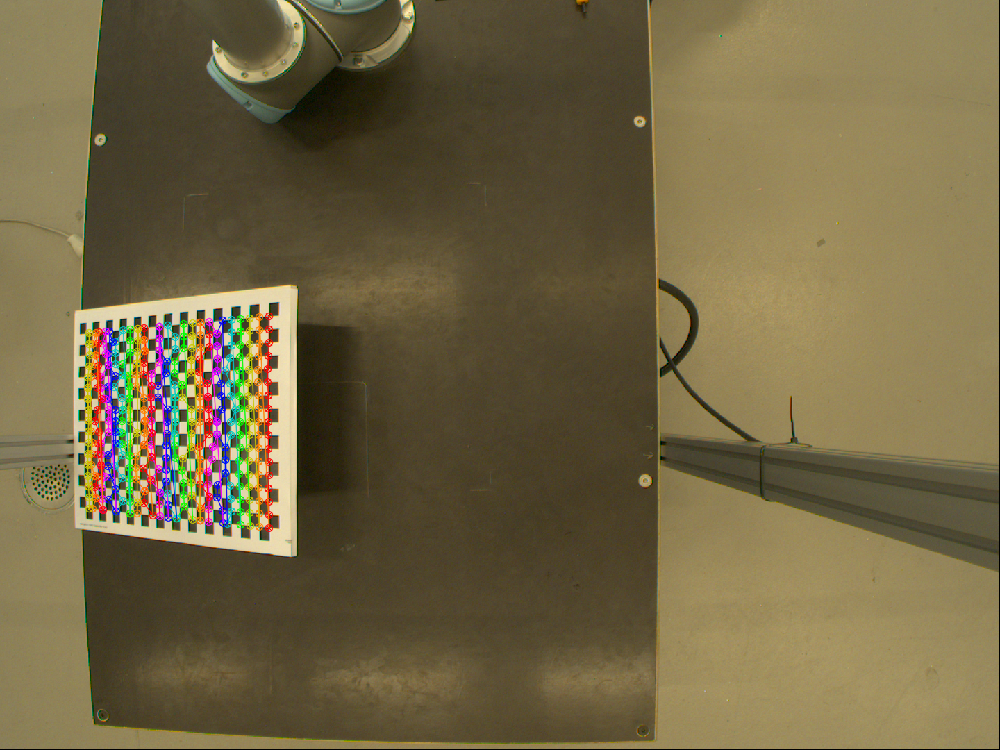

In [16]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((24*17,3), np.float32)
objp[:,:2] = np.mgrid[0:24,0:17].T.reshape(-1,2)
objpoints = []
imgpoints = []
imgs = [f'img{i}.png' for i in range(1, 5)]
for f in imgs:
    img = cv2.imread(f)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (17, 24), None)
    if ret:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)
        img = cv2.drawChessboardCorners(img, (17,24), corners2,ret)
        cv2_imshow(img)

In [17]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

In [18]:
img = cv2.imread('img5.png')
h,  w = img.shape[:2]
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))


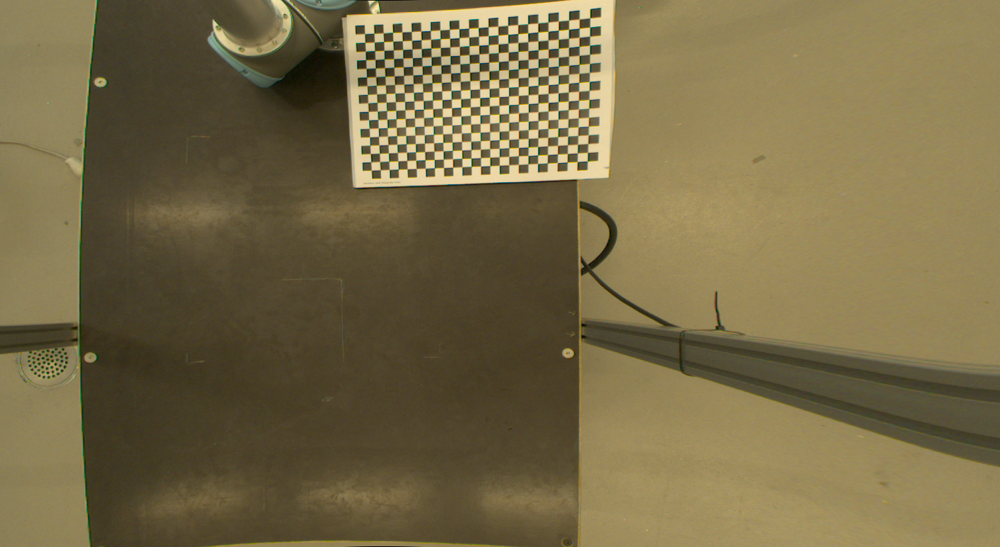

In [19]:
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)
x, y, w, h = roi
dst = dst[y:y+h, x:x+w]
cv2_imshow(dst)